## Tutorial : https://medium.com/@a.karazhay/guide-augment-images-and-multiple-bounding-boxes-for-deep-learning-in-4-steps-with-the-notebook-9b263e414dac

In [1]:
import imgaug as ia
ia.seed(1)
# imgaug uses matplotlib backend for displaying images
%matplotlib inline
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from imgaug import augmenters as iaa 
# imageio library will be used for image input/output
import imageio
import pandas as pd
import numpy as np
import re
import os
import glob
# this library is needed to read XML files for converting it into CSV
# import xml.etree.ElementTree as ET
import shutil
import json

In [4]:
label_data = pd.read_csv('final_labels_skipped_104_total_1119.csv', index_col="External ID")
# label_data

In [7]:
label_data = label_data[label_data.Label != "{}"]
label_data.sort_values('External ID')
# label_data

,ID,DataRow ID,Labeled Data,Label,Created By,Project Name,Created At,Updated At,Seconds to Label,Agreement,Benchmark Agreement,Benchmark ID,Benchmark Reference ID,Dataset Name,Reviews,View Label
External ID,,,,,,,,,,,,,,,,
gate_0.jpg,ck5jsjwx0gi370952o69k80hs,ck5jatd0741d60doqdvfo49gn,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5jsjpuq03u00yc6qdf...",matthewgeng2@gmail.com,2020 Aquadrone Vision Data,1579364009000,1579364009000,12.822,NaN,NaN,NaN,NaN,Gates,[],https://editor.labelbox.com?project=ck5injhcdv...
gate_1.jpg,ck5jttkfl8bbg0978n73oop07,ck5jatd0741da0doq4lbvbe9d,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5k4fvi2295z0yczy40...",matthewgeng2@gmail.com,2020 Aquadrone Vision Data,1579366139000,1579383980000,5.820,NaN,NaN,NaN,NaN,Gates,[],https://editor.labelbox.com?project=ck5injhcdv...
gate_100.jpg,ck5jtxbyk8bvy09780sd3672q,ck5jatd0i41oa0doqcd2b66cg,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5jtwuap24n60ycznl1...",matthewgeng2@gmail.com,2020 Aquadrone Vision Data,1579366315000,1579366315000,23.372,NaN,NaN,NaN,NaN,Gates,[],https://editor.labelbox.com?project=ck5injhcdv...
gate_101.jpg,ck5ju9ych2s4v0a56daljrtss,ck5jatd0i41oe0doq1ldg6fhy,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5ju9mg004jf11bwkhz...",jinsun99@yahoo.com,2020 Aquadrone Vision Data,1579366904000,1579374678000,30.754,NaN,NaN,NaN,NaN,Gates,[],https://editor.labelbox.com?project=ck5injhcdv...
gate_102.jpg,ck5jt5yeygkh30952ezvs5q1f,ck5jatd0i41oi0doq90e89gzt,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5jt5a36040u11bwg0h...",matthewgeng2@gmail.com,2020 Aquadrone Vision Data,1579365038000,1579365038000,29.640,NaN,NaN,NaN,NaN,Gates,[],https://editor.labelbox.com?project=ck5injhcdv...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
path_95.jpg,ck5k3nbhdxqgf08356frxj3pl,ck5javo0u43f20doq9nk75oux,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5k3nb9r08if11bw5xi...",matthewgeng2@gmail.com,2020 Aquadrone Vision Data,1579382644000,1579382644000,1.306,NaN,NaN,NaN,NaN,Paths,[],https://editor.labelbox.com?project=ck5injhcdv...
path_96.jpg,ck5k25pdytq7y0770odak6iw9,ck5javo0u43f60doqcihmdgx7,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5k25oog28160yczs4v...",matthewgeng2@gmail.com,2020 Aquadrone Vision Data,1579380143000,1579380143000,2.336,NaN,NaN,NaN,NaN,Paths,[],https://editor.labelbox.com?project=ck5injhcdv...
path_97.jpg,ck5k3amuu3y6u0a566eu0phqz,ck5javo0u43fa0doq93v91i5s,https://storage.labelbox.com/ck5ec4ea3duqe0899...,"{""objects"":[{""featureId"":""ck5k3amq808a10yc6hz5...",matthewgeng2@gmail.com,2020 Aquadrone Vision Data,1579382052000,1579382052000,1.654,NaN,NaN,NaN,NaN,Paths,[],https://editor.labelbox.com?project=ck5injhcdv...


In [8]:
label_col = label_data['Label']
# label_col

In [9]:
label_dict = label_col.to_dict()
# label_dict

In [10]:
for key in label_dict:
#     print(key)
    label_dict[key] = json.loads(label_dict[key])
#     print(label_dict[key])

In [26]:
# for i, file in enumerate(os.listdir(dir_path)):
#     file_path = os.path.join(dir_path, file)
#     print(imageio.imread(file_path).shape[0])
#     if i > 30:
#         break

652
1080
1080
1080
1080
1080
1080
1080
1080
1080
480
1080
1080
1080
1080
1080
1080
1216
1216
1216
480
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216


In [36]:
dir_path = "1119_images_final_test"

file_name_list = []
width_list = []
height_list = []
class_list = []
xmin_list = []
ymin_list = []
xmax_list = []
ymax_list = []
count = 1
for key in label_dict:
#     print(key)
    count +=1
    for value in label_dict[key]['objects']:
        key_path = os.path.join(dir_path, key)
        
        file_name_list.append(key)

        class_name = value['title']
        
        width = imageio.imread(key_path).shape[0]
        height = imageio.imread(key_path).shape[1]

        box_width = int(value['bbox']['width'])
        box_height = int(value['bbox']['height'])
        
        x1 = int(value['bbox']['left'])
        y1 = int(value['bbox']['top'])
        
        x2 = x1 + box_width
        y2 = y1 + box_height
        
        x1, x2 = max_pair(x1, x2)
        y1, y2 = max_pair(y1, y2)
        
#       print('{} {} {} {} {} {} {} {}'.format(key, width, height, class_name, x1, y1, x2, y2))
        width_list.append(width)
        height_list.append(height)
        class_list.append(class_name)
        xmin_list.append(x1)
        ymin_list.append(y1)
        xmax_list.append(x2)
        ymax_list.append(y2)

print(len(file_name_list))
print(len(width_list))
print(len(height_list))
print(len(class_list))
print(len(xmin_list))
print(len(ymin_list))
print(len(xmax_list))
print(len(ymax_list))
print(count)

1974
1974
1974
1974
1974
1974
1974
1974
1120


In [12]:
def max_pair(x1, x2):
    if x1 < x2:
        return x1, x2
    elif x1 > x2:
        return x2, x1
    
    return x1, x2

In [37]:
data_img = {'filename': file_name_list, 'width': width_list, 'height': height_list, 
        'class': class_list, 'xmin': xmin_list, 'ymin': ymin_list, 'xmax':xmax_list, 'ymax':ymax_list}

In [38]:
labels_df = pd.DataFrame(data = data_img)
labels_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,gate_20.jpg,1216,1936,small_gate,402,99,1461,1012
1,gate_52.jpg,1216,1936,total_gate,344,335,1237,796
2,gate_52.jpg,1216,1936,big_gate,350,356,881,794
3,gate_52.jpg,1216,1936,small_gate,833,343,1227,762
4,gate_84.jpg,1080,1920,small_gate,546,298,1243,865
...,...,...,...,...,...,...,...,...
1969,path_151.jpg,1080,1920,path,1193,716,1323,906
1970,path_535.jpg,480,640,path,217,122,293,305
1971,path_183.jpg,1080,1920,path,357,470,869,967
1972,path_215.jpg,1080,1920,path,285,237,788,736


In [39]:
# apply xml_to_csv() function to convert all XML files in images/ folder into labels.csv
labels_df.to_csv(('labels.csv'), index=None)
print('Successfully converted xml to csv.')

Successfully converted xml to csv.


In [40]:
grouped = labels_df.groupby('filename')

In [41]:
group_df = grouped.get_group('gate_174.jpg')
group_df = group_df.reset_index()
group_df = group_df.drop(['index'], axis=1)
group_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,gate_174.jpg,1080,1920,small_gate,300,196,745,759
1,gate_174.jpg,1080,1920,big_gate,692,143,1369,884
2,gate_174.jpg,1080,1920,total_gate,297,139,1371,887


In [42]:
# get bounding boxes coordinates from grouped data frame and write into array        
bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
# display the array we've got
bb_array

array([[ 300,  196,  745,  759],
       [ 692,  143, 1369,  884],
       [ 297,  139, 1371,  887]])

In [34]:
# load images as NumPy arrays and append them to images list
images = []
for index, file in enumerate(glob.glob('1119_images_final/*.jpg')):
    images.append(imageio.imread(file))
    print(imageio.imread(file).shape)
    if index > 130:
        break
    
# how many images we have
print('We have {} images'.format(len(images)))

(652, 1086, 4)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(480, 640, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(480, 640, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1216, 1936, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 3)
(1080, 1920, 

In [20]:
# what are the sizes of the images
for index, file in enumerate(glob.glob('1119_images_final_test/*.jpg')):
    print('Image {} have size of {}'.format(file[7:], images[index].shape))
    print(index)
    if index > 30:
        break

Image ages_final_test/gate_0.jpg have size of (652, 1086, 4)
0
Image ages_final_test/gate_1.jpg have size of (1080, 1920, 3)
1
Image ages_final_test/gate_100.jpg have size of (1080, 1920, 3)
2
Image ages_final_test/gate_101.jpg have size of (1080, 1920, 3)
3
Image ages_final_test/gate_102.jpg have size of (1080, 1920, 3)
4
Image ages_final_test/gate_103.jpg have size of (1080, 1920, 3)
5
Image ages_final_test/gate_104.jpg have size of (1080, 1920, 3)
6
Image ages_final_test/gate_105.jpg have size of (1080, 1920, 3)
7
Image ages_final_test/gate_106.jpg have size of (1080, 1920, 3)
8
Image ages_final_test/gate_109.jpg have size of (1080, 1920, 3)
9
Image ages_final_test/gate_11.jpg have size of (480, 640, 3)
10
Image ages_final_test/gate_110.jpg have size of (1080, 1920, 3)
11
Image ages_final_test/gate_111.jpg have size of (1080, 1920, 3)
12
Image ages_final_test/gate_112.jpg have size of (1080, 1920, 3)
13
Image ages_final_test/gate_113.jpg have size of (1080, 1920, 3)
14
Image ages_fi

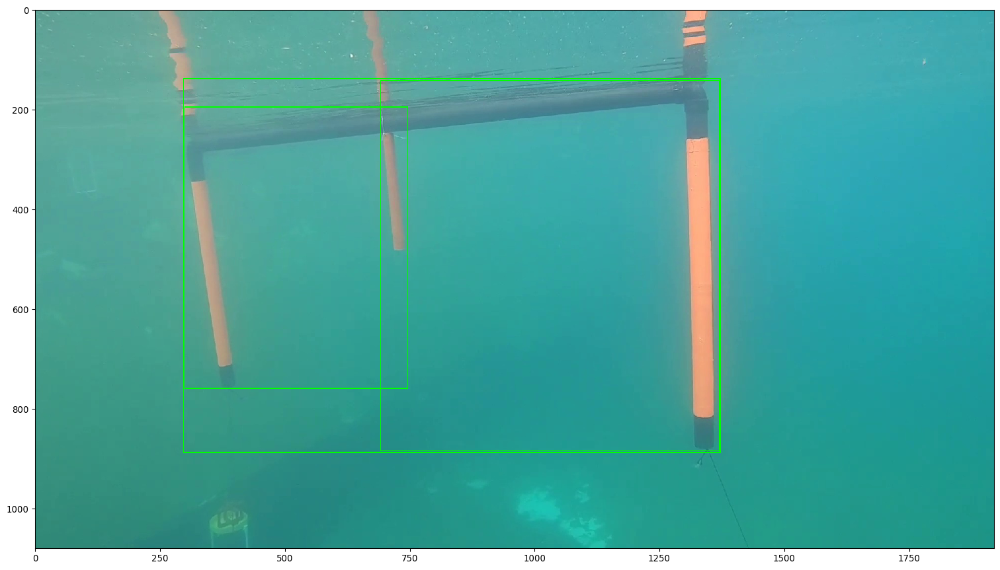

In [43]:
# pass the array of bounding boxes coordinates to the imgaug library
bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=images[63].shape)
# display the image and draw bounding boxes
ia.imshow(bbs.draw_on_image(images[63], size=2))

In [44]:
# to resize the images we create two augmenters
# one is used when the image height is more than 600px and the other when the width is more than 600px
height_resize = iaa.Sequential([ 
    iaa.Resize({"height": 600, "width": 'keep-aspect-ratio'})
])

# our data mainly has 1920x1080
# the others are 640x480
width_resize = iaa.Sequential([ 
    iaa.Resize({"height": 'keep-aspect-ratio', "width": 600})
])

In [48]:
# function to convert BoundingBoxesOnImage object into DataFrame
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

In [50]:
def resize_imgaug(df, images_path, aug_images_path, image_prefix):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')    
    
    for filename in df['filename'].unique():
    #   Get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)
        
    #   The only difference between if and elif statements below is the use of height_resize and width_resize augmentors
    #   deffined previously.

    #   If image height is greater than or equal to image width 
    #   AND greater than 600px perform resizing augmentation shrinking image height to 600px.
        if group_df['height'].unique()[0] >= group_df['width'].unique()[0] and group_df['height'].unique()[0] > 600:
        #   read the image
            image = imageio.imread(images_path+filename, pilmode="RGB")
        #   get bounding boxes coordinates and write into array        
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        #   pass the array of bounding boxes coordinates to the imgaug library
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
        #   apply augmentation on image and on the bounding boxes
            image_aug, bbs_aug = height_resize(image=image, bounding_boxes=bbs)
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])
            
    #   if image width is greater than image height 
    #   AND greater than 600px perform resizing augmentation shrinking image width to 600px
        elif group_df['width'].unique()[0] > group_df['height'].unique()[0] and group_df['width'].unique()[0] > 600:
        #   read the image
            image = imageio.imread(images_path+filename, pilmode="RGB")
        #   get bounding boxes coordinates and write into array        
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        #   pass the array of bounding boxes coordinates to the imgaug library
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
        #   apply augmentation on image and on the bounding boxes
            image_aug, bbs_aug = width_resize(image=image, bounding_boxes=bbs)
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])

    #     append image info without any changes if it's height and width are both less than 600px 
        else:
            aug_bbs_xy = pd.concat([aug_bbs_xy, group_df])
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [51]:
# apply resizing augmentation to our images and write the updated images and bounding boxes annotations to the DataFrame 
# we will not apply prefix to our files and will overwrite images in the same directory
resized_images_df = resize_imgaug(labels_df, '1119_images_final_test/', '1119_images_final_test2/', '')

In [52]:
print(resized_images_df)

          filename width height       class        xmin        ymin  \
0      gate_20.jpg   955    600  small_gate  198.300613   48.848686   
1      gate_52.jpg   955    600  total_gate  169.690079  165.296051   
2      gate_52.jpg   955    600    big_gate  172.649796  175.657883   
3      gate_52.jpg   955    600  small_gate  410.906494  169.243423   
4      gate_84.jpg  1067    600  small_gate  303.428131  165.555557   
...            ...   ...    ...         ...         ...         ...   
1969  path_151.jpg  1067    600        path  662.984863  397.777771   
1970  path_535.jpg   800    600        path  271.250000  152.500000   
1971  path_183.jpg  1067    600        path  198.395309  261.111115   
1972  path_215.jpg  1067    600        path  158.382812  131.666656   
1973  path_247.jpg  1067    600        path  191.170822   94.444443   

            xmax        ymax  
0     720.689575  499.342102  
1     610.193726  392.763153  
2     434.584198  391.776337  
3     605.260864  375.9

In [53]:
# overwrite the labels.csv with updated info
resized_images_df.to_csv('test_labels.csv', index=False)

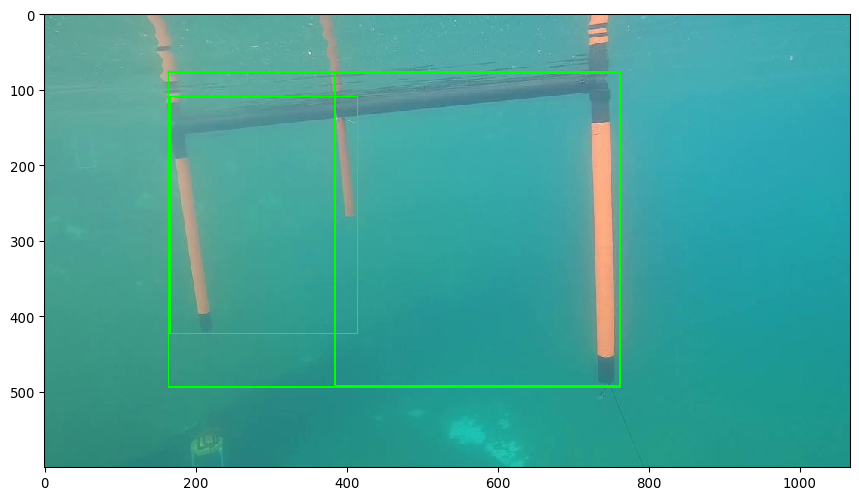

In [55]:
grouped = resized_images_df.groupby('filename')
group_df = grouped.get_group('gate_174.jpg')
group_df = group_df.reset_index()
group_df = group_df.drop(['index'], axis=1)
bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
image = imageio.imread('1119_images_final_test2/gate_174.jpg')
bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
ia.imshow(bbs.draw_on_image(image, size=2))

In [96]:
# This setup of augmentation parameters will pick two of four given augmenters and apply them in random order
aug = iaa.SomeOf(2, [    
    iaa.Affine(scale=(0.5, 1.5)),
    iaa.Affine(rotate=(-20, 20)),
    iaa.Affine(translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}),
    iaa.Fliplr(1),
    iaa.Multiply((0.5, 1.5)),
    iaa.GaussianBlur(sigma=(1.0, 3.0)),
    iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))
])

In [57]:
def image_aug(df, images_path, aug_images_path, image_prefix, augmentor):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')
    
    for filename in df['filename'].unique():
    #   get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)   
    #   read the image
    #   had to add pilmode="RGB" because error of alpha channel
        image = imageio.imread(images_path+filename, pilmode="RGB")
    #   get bounding boxes coordinates and write into array        
        bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
    #   pass the array of bounding boxes coordinates to the imgaug library
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
    #   apply augmentation on image and on the bounding boxes
        image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
    #   disregard bounding boxes which have fallen out of image pane    
        bbs_aug = bbs_aug.remove_out_of_image()
    #   clip bounding boxes which are partially outside of image pane
        bbs_aug = bbs_aug.clip_out_of_image()
        
    #   don't perform any actions with the image if there are no bounding boxes left in it    
        if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
            pass
        
    #   otherwise continue
        else:
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)    
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])            
    
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [130]:
# Apply augmentation to our images and save files into 'aug_images/' folder with 'aug' prefix.
# Write the updated images and bounding boxes annotations to the augmented_images_df dataframe.

# I think depending on the severity of the augment, there might not be a bounding box anymore, therefore it doesn't write it to the new folder
augmented_images_df = image_aug(resized_images_df, '1119_images_final_test2/', 'aug_1119_images_final_test/images/', 'aug_', aug)

In [143]:
resized_images_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,gate_20.jpg,955,600,small_gate,198.300613,48.848686,720.689575,499.342102
1,gate_52.jpg,955,600,total_gate,169.690079,165.296051,610.193726,392.763153
2,gate_52.jpg,955,600,big_gate,172.649796,175.657883,434.584198,391.776337
3,gate_52.jpg,955,600,small_gate,410.906494,169.243423,605.260864,375.986847
4,gate_84.jpg,1067,600,small_gate,303.428131,165.555557,690.771362,480.555542
...,...,...,...,...,...,...,...,...
1969,path_151.jpg,1067,600,path,662.984863,397.777771,735.229675,503.333344
1970,path_535.jpg,800,600,path,271.250000,152.500000,366.250000,381.250000
1971,path_183.jpg,1067,600,path,198.395309,261.111115,482.928650,537.222229
1972,path_215.jpg,1067,600,path,158.382812,131.666656,437.914581,408.888885


In [142]:
augmented_images_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,aug_gate_20.jpg,955,600,small_gate,21.300613,0.000000,543.689575,440.342102
1,aug_gate_52.jpg,955,600,total_gate,115.343719,141.562698,633.748413,409.256317
2,aug_gate_52.jpg,955,600,big_gate,118.826851,153.756973,427.083160,408.094971
3,aug_gate_52.jpg,955,600,small_gate,399.218170,146.208145,627.943237,389.513184
4,aug_gate_84.jpg,1067,600,small_gate,271.228638,244.555557,658.571899,559.555542
...,...,...,...,...,...,...,...,...
1969,aug_path_151.jpg,1067,600,path,644.298523,408.972931,725.664612,520.547974
1970,aug_path_535.jpg,800,600,path,229.319199,172.214066,395.646484,419.584320
1971,aug_path_183.jpg,1067,600,path,201.663239,277.302673,554.106567,600.000000
1972,aug_path_215.jpg,1067,600,path,244.680679,198.204056,484.699707,436.993011


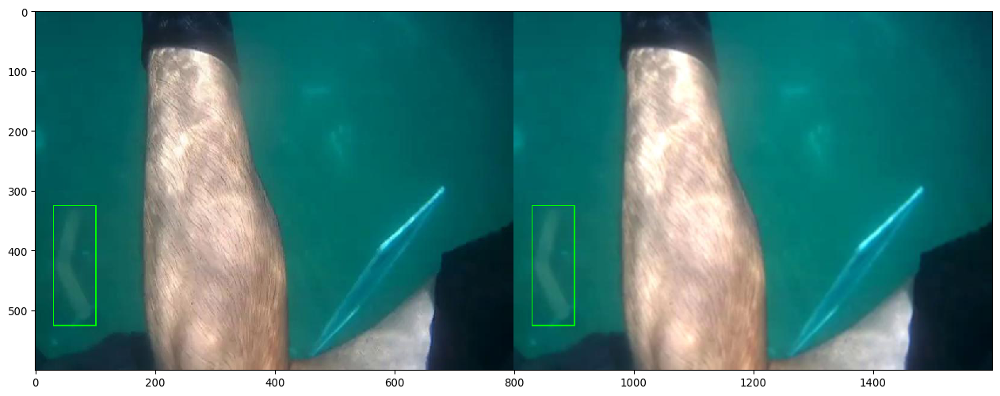

In [132]:
grouped_resized = resized_images_df.groupby('filename')
grouped_augmented = augmented_images_df.groupby('filename')

for filename in resized_images_df['filename'].unique():
    
    if filename == "path_486.jpg":

        group_r_df = grouped_resized.get_group(filename)
        group_r_df = group_r_df.reset_index()
        group_r_df = group_r_df.drop(['index'], axis=1)
        bb_r_array = group_r_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        resized_img = imageio.imread('1119_images_final_test2/'+filename, pilmode="RGB")
        bbs_r = BoundingBoxesOnImage.from_xyxy_array(bb_r_array, shape=resized_img.shape)

        group_a_df = grouped_augmented.get_group('aug_'+filename)
        group_a_df = group_a_df.reset_index()
        group_a_df = group_a_df.drop(['index'], axis=1)
        bb_a_array = group_a_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        augmented_img = imageio.imread('aug_1119_images_final_test/images/'+'aug_'+filename, pilmode="RGB")
        bbs_a = BoundingBoxesOnImage.from_xyxy_array(bb_a_array, shape=augmented_img.shape)

        ia.imshow(np.hstack([
                bbs_r.draw_on_image(resized_img, size=2),
                bbs_a.draw_on_image(augmented_img, size=2)
                ]))

gate_20.jpg
[[198.30061   48.848686 720.6896   499.3421  ]]
[[ 21.300613   0.       543.6896   440.3421  ]]


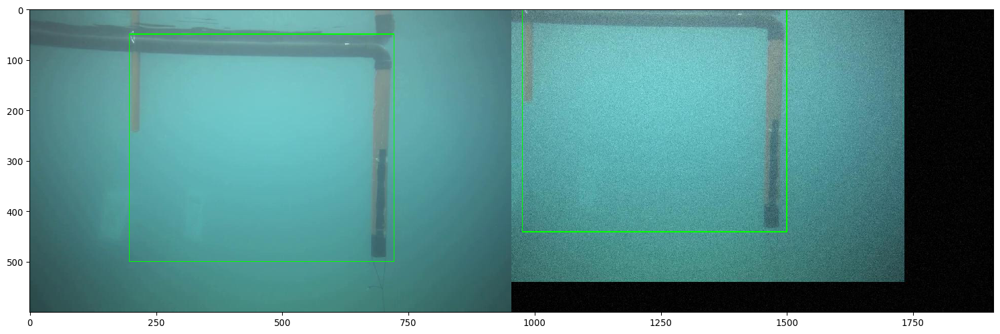

gate_52.jpg
[[169.69008 165.29605 610.1937  392.76315]
 [172.6498  175.65788 434.5842  391.77634]
 [410.9065  169.24342 605.26086 375.98685]]
[[115.34372 141.5627  633.7484  409.25632]
 [118.82685 153.75697 427.08316 408.09497]
 [399.21817 146.20815 627.94324 389.51318]]


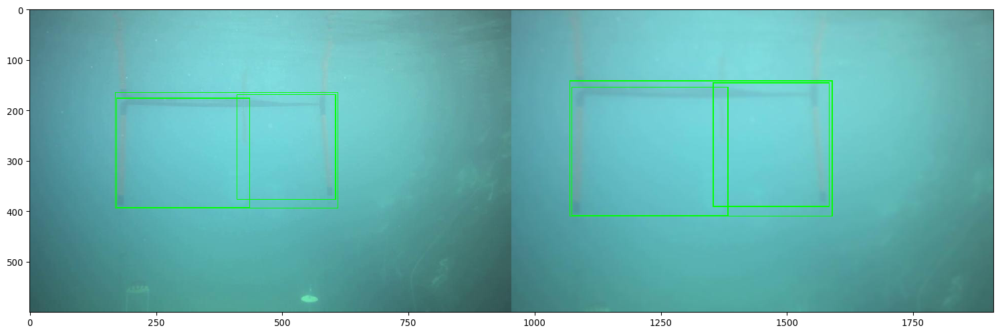

gate_84.jpg
[[303.42813 165.55556 690.77136 480.55554]]
[[271.22864 244.55556 658.5719  559.55554]]


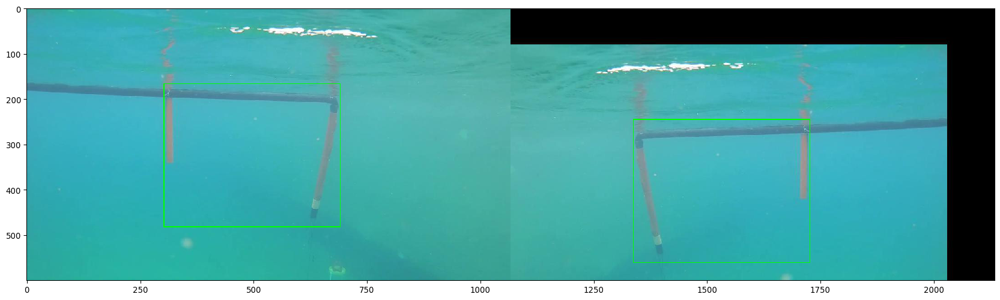

gate_116.jpg
[[561.35846 137.66447 904.19165 418.42105]]
[[575.0463  111.40534 955.      437.71695]]


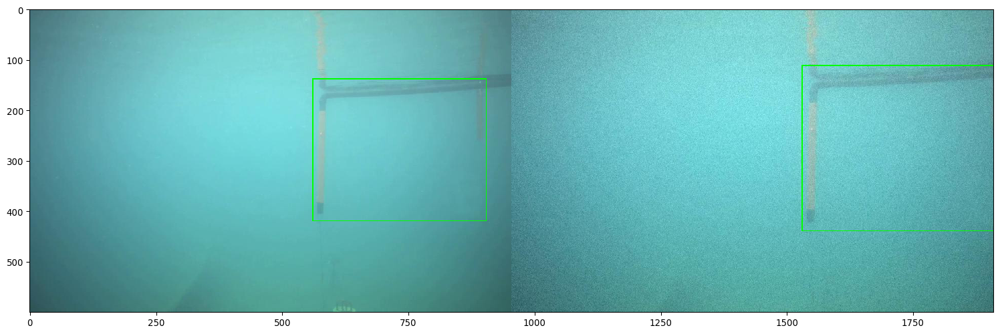

gate_148.jpg
[[205.61978  71.11111 409.01666 328.3333 ]
 [391.78906  67.22222 665.2078  376.1111 ]]
[[ 72.02547   69.02248  316.88     357.57178 ]
 [254.71075   20.842255 577.4741   372.3999  ]]


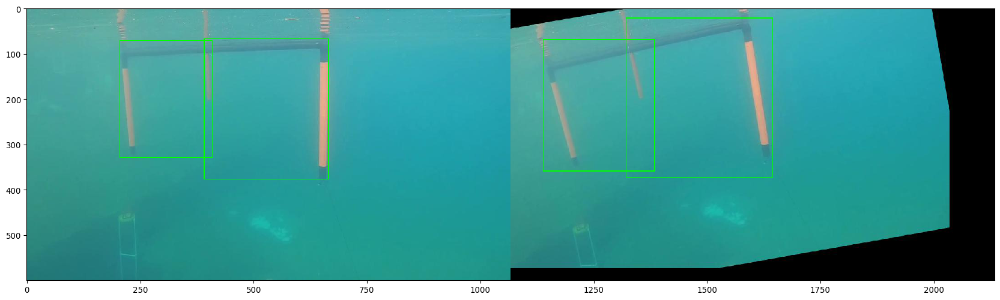

gate_23.jpg
[[295.97107   19.736843 879.0341   547.2039  ]]
[[399.97107 111.73685 955.      600.     ]]


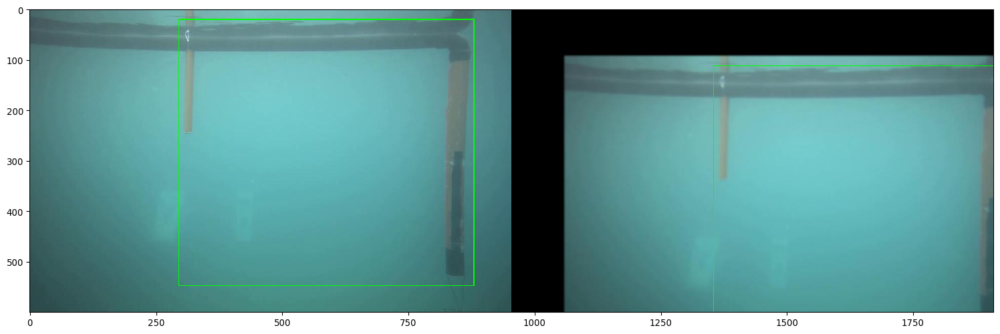

gate_55.jpg
[[560.3719  144.57237 770.51135 372.5329 ]
 [301.8905  143.58553 577.14355 391.77634]
 [305.3435  148.51973 771.4979  386.8421 ]]
[[532.13293 170.75935 699.0597  350.16257]
 [339.4391  178.76706 555.8105  376.19232]
 [342.23575 173.65675 700.44196 372.35864]]


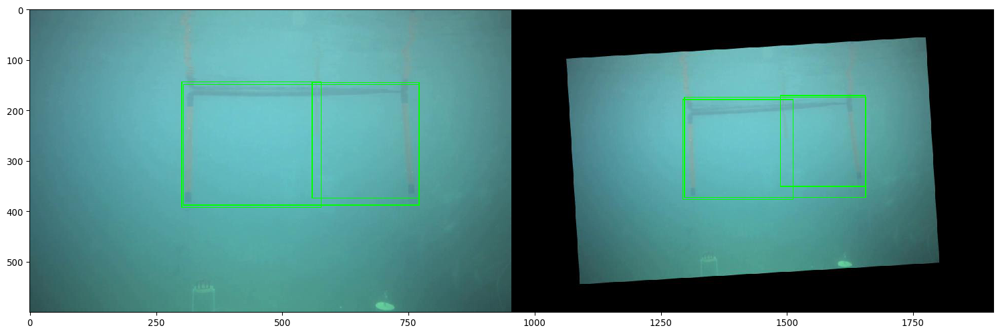

gate_87.jpg
[[ 75.02344   70.       430.69012  449.44446 ]
 [397.9021    67.77778  799.6943   363.8889  ]
 [ 78.913536  76.66667  800.8057   443.3333  ]]
[[ 710.3099   119.      1065.9766   498.44446]
 [ 341.30573  116.77778  743.0979   412.8889 ]
 [ 340.19427  125.66667 1062.0864   492.3333 ]]


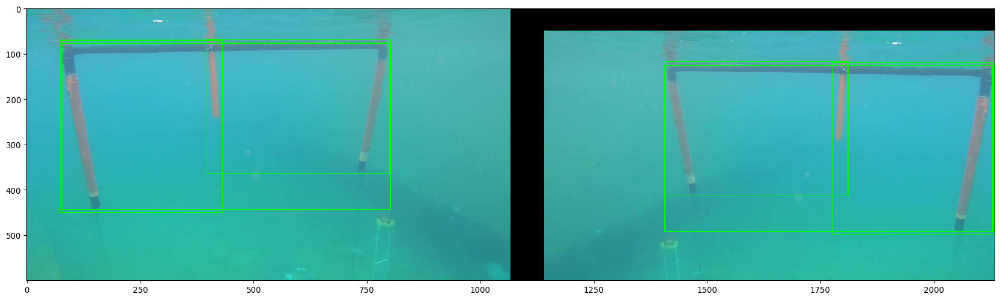

gate_119.jpg
[[146.50569  97.69737 513.5098  469.2434 ]]
[[441.49017  97.69737 808.4943  469.2434 ]]


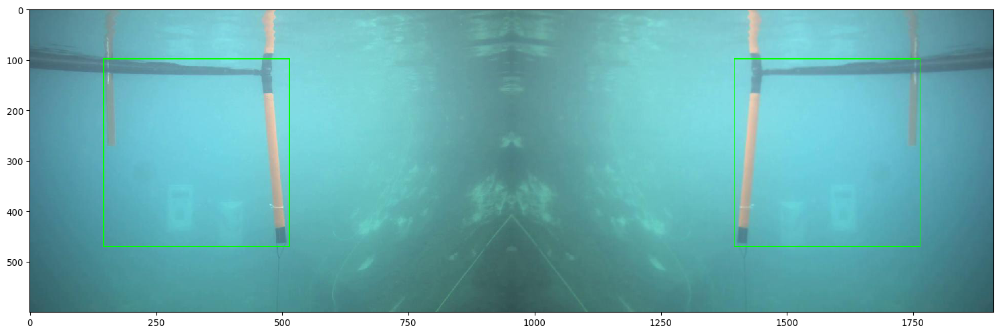

gate_151.jpg
[[188.3922   86.66667 406.79373 346.6667 ]
 [381.78592  85.55556 671.3208  408.33334]]
[[188.3922   86.66667 406.79373 346.6667 ]
 [381.78592  85.55556 671.3208  408.33334]]


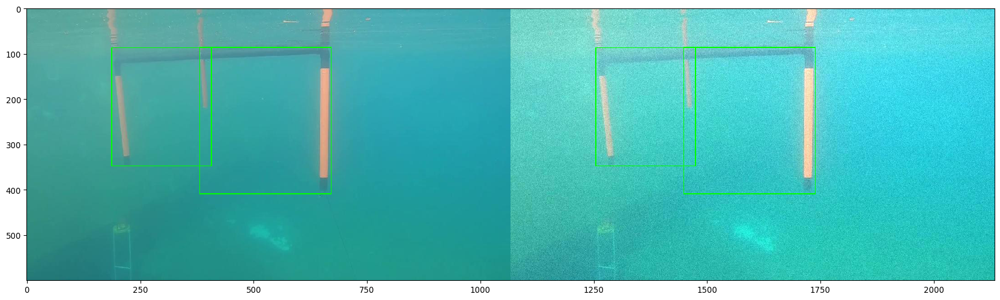

gate_26.jpg
[[226.41786   30.098684 806.5212   532.4013  ]]
[[148.47882   30.098684 728.58215  532.4013  ]]


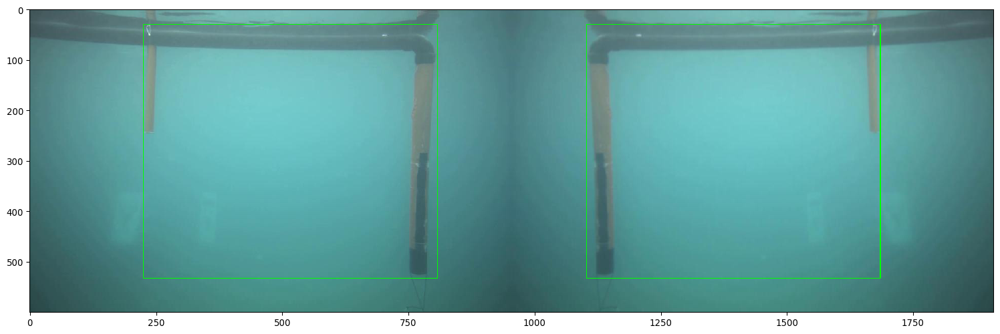

gate_58.jpg
[[214.57903 111.51316 702.9313  517.5987 ]]
[[214.57903 111.51316 702.9313  517.5987 ]]


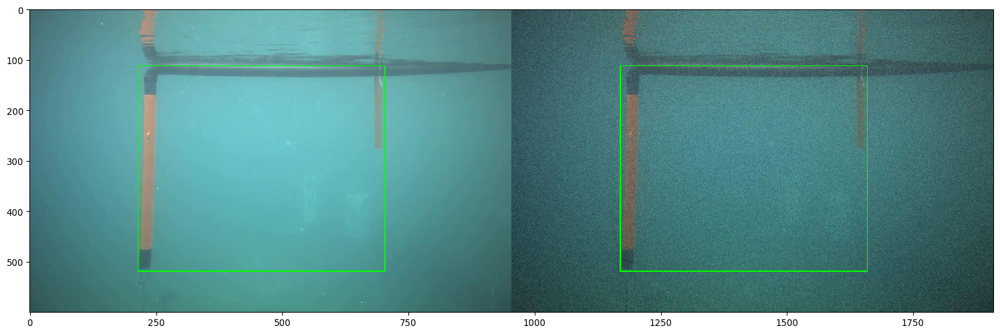

gate_90.jpg
[[214.51146  85.55556 533.5     433.3333 ]
 [515.7167   78.88889 928.06775 394.44443]
 [214.51146  84.44444 929.1792  429.44446]]
[[533.5      85.55556 852.4885  433.3333 ]
 [138.93225  78.88889 551.2833  394.44443]
 [137.8208   84.44444 852.4885  429.44446]]


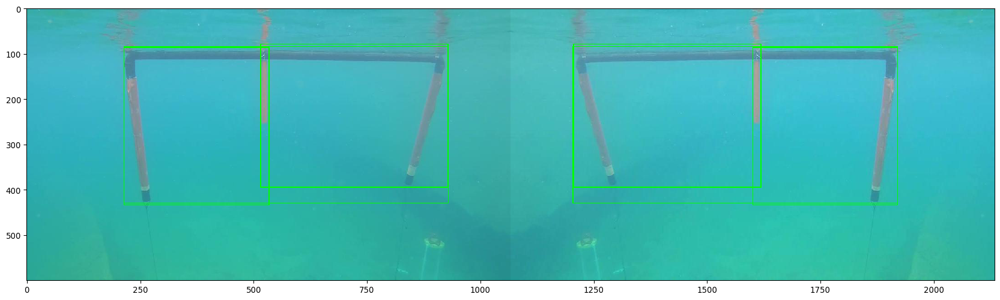

gate_122.jpg
[[266.37396   20.723684 752.7531   524.0132  ]]
[[202.24689   20.723684 688.62604  524.0132  ]]


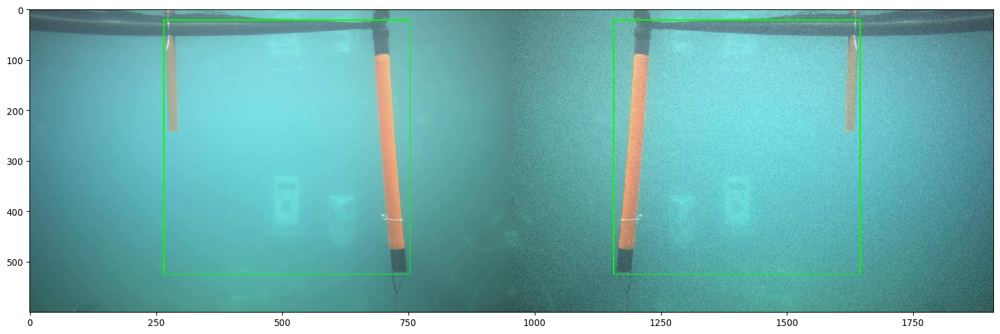

gate_154.jpg
[[177.2776   84.44444 679.1011  429.44446]]
[[160.34453   27.007168 713.5904   452.42697 ]]


KeyboardInterrupt: 

In [187]:
grouped_resized = resized_images_df.groupby('filename')
grouped_augmented = augmented_images_df.groupby('filename')

for filename in resized_images_df['filename'].unique():
    print(filename)
    group_r_df = grouped_resized.get_group(filename)
    group_r_df = group_r_df.reset_index()
    group_r_df = group_r_df.drop(['index'], axis=1)
    bb_r_array = group_r_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
    print(bb_r_array)
    resized_img = imageio.imread('1119_images_final_test2/'+filename, pilmode="RGB")
    bbs_r = BoundingBoxesOnImage.from_xyxy_array(bb_r_array, shape=resized_img.shape)

    group_a_df = grouped_augmented.get_group('aug_'+filename)
    group_a_df = group_a_df.reset_index()
    group_a_df = group_a_df.drop(['index'], axis=1)
    bb_a_array = group_a_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
    print(bb_a_array)
    augmented_img = imageio.imread('aug_1119_images_final_test/images/'+'aug_'+filename, pilmode="RGB")
    bbs_a = BoundingBoxesOnImage.from_xyxy_array(bb_a_array, shape=augmented_img.shape)

    ia.imshow(np.hstack([
                bbs_r.draw_on_image(resized_img, size=2),
                bbs_a.draw_on_image(augmented_img, size=2)
                ]))

In [176]:
# augmented_images_df = augmented_images_df.reset_index()
# augmented_images_df = augmented_images_df.drop("level_0", 1)
# augmented_images_df = augmented_images_df.drop("index", 1)
# augmented_images_df.set("index")
augmented_images_df = augmented_images_df.dropna(how='any',axis=0) 
augmented_images_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,aug_gate_20.jpg,955,600,small_gate,21.300613,0.000000,543.689575,440.342102
1,aug_gate_52.jpg,955,600,total_gate,115.343719,141.562698,633.748413,409.256317
2,aug_gate_52.jpg,955,600,big_gate,118.826851,153.756973,427.083160,408.094971
3,aug_gate_52.jpg,955,600,small_gate,399.218170,146.208145,627.943237,389.513184
4,aug_gate_84.jpg,1067,600,small_gate,271.228638,244.555557,658.571899,559.555542
...,...,...,...,...,...,...,...,...
1969,aug_path_151.jpg,1067,600,path,644.298523,408.972931,725.664612,520.547974
1970,aug_path_535.jpg,800,600,path,229.319199,172.214066,395.646484,419.584320
1971,aug_path_183.jpg,1067,600,path,201.663239,277.302673,554.106567,600.000000
1972,aug_path_215.jpg,1067,600,path,244.680679,198.204056,484.699707,436.993011


In [194]:
resized_images_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,gate_20.jpg,955,600,small_gate,198.300613,48.848686,720.689575,499.342102
1,gate_52.jpg,955,600,total_gate,169.690079,165.296051,610.193726,392.763153
2,gate_52.jpg,955,600,big_gate,172.649796,175.657883,434.584198,391.776337
3,gate_52.jpg,955,600,small_gate,410.906494,169.243423,605.260864,375.986847
4,gate_84.jpg,1067,600,small_gate,303.428131,165.555557,690.771362,480.555542
...,...,...,...,...,...,...,...,...
1969,path_151.jpg,1067,600,path,662.984863,397.777771,735.229675,503.333344
1970,path_535.jpg,800,600,path,271.250000,152.500000,366.250000,381.250000
1971,path_183.jpg,1067,600,path,198.395309,261.111115,482.928650,537.222229
1972,path_215.jpg,1067,600,path,158.382812,131.666656,437.914581,408.888885


In [173]:
df1 = augmented_images_df[augmented_images_df.isna().any(axis=1)]
df1 = df1.dropna(how='any',axis=0) 
df1

,filename,width,height,class,xmin,ymin,xmax,ymax


In [178]:
augmented_images_df.to_csv('augmented.csv', index=False)

In [179]:
all_labels_df = pd.concat([resized_images_df, augmented_images_df])
all_labels_df.to_csv('all_labels.csv', index=False)

In [195]:
resized_dict = resized_images_df.to_dict('index')
print(type(resized_dict[0]['filename']))
resized_dict 

<class 'str'>


{0: {'filename': 'gate_20.jpg',
  'width': 955,
  'height': 600,
  'class': 'small_gate',
  'xmin': 198.3006134033203,
  'ymin': 48.84868621826172,
  'xmax': 720.6895751953125,
  'ymax': 499.34210205078125},
 1: {'filename': 'gate_52.jpg',
  'width': 955,
  'height': 600,
  'class': 'total_gate',
  'xmin': 169.69007873535156,
  'ymin': 165.29605102539062,
  'xmax': 610.1937255859375,
  'ymax': 392.7631530761719},
 2: {'filename': 'gate_52.jpg',
  'width': 955,
  'height': 600,
  'class': 'big_gate',
  'xmin': 172.64979553222656,
  'ymin': 175.6578826904297,
  'xmax': 434.5841979980469,
  'ymax': 391.7763366699219},
 3: {'filename': 'gate_52.jpg',
  'width': 955,
  'height': 600,
  'class': 'small_gate',
  'xmin': 410.906494140625,
  'ymin': 169.24342346191406,
  'xmax': 605.2608642578125,
  'ymax': 375.9868469238281},
 4: {'filename': 'gate_84.jpg',
  'width': 1067,
  'height': 600,
  'class': 'small_gate',
  'xmin': 303.4281311035156,
  'ymin': 165.55555725097656,
  'xmax': 690.771362

In [180]:
augmented_dict = augmented_images_df.to_dict('index')
print(type(augmented_dict[0]['filename']))
augmented_dict

<class 'str'>


{0: {'filename': 'aug_gate_20.jpg',
  'width': 955,
  'height': 600,
  'class': 'small_gate',
  'xmin': 21.300613403320312,
  'ymin': 0.0,
  'xmax': 543.6895751953125,
  'ymax': 440.34210205078125},
 1: {'filename': 'aug_gate_52.jpg',
  'width': 955,
  'height': 600,
  'class': 'total_gate',
  'xmin': 115.34371948242188,
  'ymin': 141.5626983642578,
  'xmax': 633.7484130859375,
  'ymax': 409.2563171386719},
 2: {'filename': 'aug_gate_52.jpg',
  'width': 955,
  'height': 600,
  'class': 'big_gate',
  'xmin': 118.82685089111328,
  'ymin': 153.75697326660156,
  'xmax': 427.0831604003906,
  'ymax': 408.094970703125},
 3: {'filename': 'aug_gate_52.jpg',
  'width': 955,
  'height': 600,
  'class': 'small_gate',
  'xmin': 399.2181701660156,
  'ymin': 146.20814514160156,
  'xmax': 627.9432373046875,
  'ymax': 389.51318359375},
 4: {'filename': 'aug_gate_84.jpg',
  'width': 1067,
  'height': 600,
  'class': 'small_gate',
  'xmin': 271.2286376953125,
  'ymin': 244.55555725097656,
  'xmax': 658.5

In [196]:
resized_dict_values = resized_dict.values()
resized_dict_values

dict_values([{'filename': 'gate_20.jpg', 'width': 955, 'height': 600, 'class': 'small_gate', 'xmin': 198.3006134033203, 'ymin': 48.84868621826172, 'xmax': 720.6895751953125, 'ymax': 499.34210205078125}, {'filename': 'gate_52.jpg', 'width': 955, 'height': 600, 'class': 'total_gate', 'xmin': 169.69007873535156, 'ymin': 165.29605102539062, 'xmax': 610.1937255859375, 'ymax': 392.7631530761719}, {'filename': 'gate_52.jpg', 'width': 955, 'height': 600, 'class': 'big_gate', 'xmin': 172.64979553222656, 'ymin': 175.6578826904297, 'xmax': 434.5841979980469, 'ymax': 391.7763366699219}, {'filename': 'gate_52.jpg', 'width': 955, 'height': 600, 'class': 'small_gate', 'xmin': 410.906494140625, 'ymin': 169.24342346191406, 'xmax': 605.2608642578125, 'ymax': 375.9868469238281}, {'filename': 'gate_84.jpg', 'width': 1067, 'height': 600, 'class': 'small_gate', 'xmin': 303.4281311035156, 'ymin': 165.55555725097656, 'xmax': 690.7713623046875, 'ymax': 480.5555419921875}, {'filename': 'gate_116.jpg', 'width': 

In [181]:
augmented_dict_values = augmented_dict.values()
augmented_dict_values

dict_values([{'filename': 'aug_gate_20.jpg', 'width': 955, 'height': 600, 'class': 'small_gate', 'xmin': 21.300613403320312, 'ymin': 0.0, 'xmax': 543.6895751953125, 'ymax': 440.34210205078125}, {'filename': 'aug_gate_52.jpg', 'width': 955, 'height': 600, 'class': 'total_gate', 'xmin': 115.34371948242188, 'ymin': 141.5626983642578, 'xmax': 633.7484130859375, 'ymax': 409.2563171386719}, {'filename': 'aug_gate_52.jpg', 'width': 955, 'height': 600, 'class': 'big_gate', 'xmin': 118.82685089111328, 'ymin': 153.75697326660156, 'xmax': 427.0831604003906, 'ymax': 408.094970703125}, {'filename': 'aug_gate_52.jpg', 'width': 955, 'height': 600, 'class': 'small_gate', 'xmin': 399.2181701660156, 'ymin': 146.20814514160156, 'xmax': 627.9432373046875, 'ymax': 389.51318359375}, {'filename': 'aug_gate_84.jpg', 'width': 1067, 'height': 600, 'class': 'small_gate', 'xmin': 271.2286376953125, 'ymin': 244.55555725097656, 'xmax': 658.5718994140625, 'ymax': 559.5555419921875}, {'filename': 'aug_gate_116.jpg', 

In [182]:
!ls

 1119_images_final			      obj.data
 1119_images_final_copy			      obj.names
 1119_images_final_test2		      obj_not_in_order
 1200_images_combined			      remove_every_other_frame.ipynb
 1200_images_renamed_final		      remove_valid.ipynb
 all_labels.csv				      rename_files.ipynb
 aug_1119_images_final_test		      rename_to_numbers.ipynb
 aug_1119_images_final_test_copy	      split_video.ipynb
 augment.ipynb				      test.txt
 augmented.csv				      test_labels.csv
 final_labels_skipped_104_total_1119.csv      train.txt
 images					      train_test_txt.ipynb
 images_exclude_safe			      train_valid
 images_removed_every_other_frame_1000_safe  'video src'
 labels.csv				      yolo_labels
 load_csv_remove_skipped_files_test.ipynb     yolov3-tiny-obj.cfg
 obj


In [150]:
def class_to_index(class_name):
    if class_name == "small_gate":
        return 0
    elif class_name == "big_gate":
        return 1
    elif class_name == "total_gate":
        return 2
    elif class_name == "path":
        return 3

In [192]:
def yolo_to_coord(x, y, width, height, width_i, height_i):
    img_w = width_i
    img_h = height_i
    x2, y2 = int((x + width/2)*img_w), int((y + height/2)*img_h)
    x1, y1 = int((x - width/2)*img_w), int((y - height/2)*img_h)
    return x1, y1, x2, y2

In [201]:
dir_aug = "aug_1119_images_final_test"
for key, ke in zip(augmented_dict_values, resized_dict_values):
    print(key['filename'])
#     key_name = os.path.splitext(key['filename'])[0] + ".txt"
#     txt_file_path = os.path.join(dir_aug, key_name)
#     txt_file = open(txt_file_path, 'a')
#     txt_file.write("test\n")
    class_name = key['class']
    class_val = class_to_index(class_name)
    width = int(key['width'])
    height = int(key['height'])
    x1, y1, x2, y2 = int(key['xmin']), int(key['ymin']), int(key['xmax']), int(key['ymax'])
    x_c = (x1 + x2)/2
    y_c = (y1 + y2)/2
    w = x2 - x1
    h = y2 - y1
    x_c /= width
    y_c /= height
    w /= width
    h /= height
    
    widthq = int(ke['width'])
    heightq = int(ke['height'])
    x1q, y1q, x2q, y2q = int(ke['xmin']), int(ke['ymin']), int(ke['xmax']), int(ke['ymax'])
    x_cq = (x1q + x2q)/2
    y_cq = (y1q + y2q)/2
    wq = x2q - x1q
    hq = y2q - y1q
    x_cq /= widthq
    y_cq /= heightq
    wq /= widthq
    hq /= heightq
    
#     if key['filename'] == "aug_path_486.jpg":
    print("{} {} {} {} \t {} {} {} {}".format(x1, y1, x2, y2, x1q, y1q, x2q, y2q))
    print("{} {} {} {} {} \n{} {} {} {} {} ".format(class_val, x_c, y_c, w, h, class_val, x_cq, y_cq, wq, hq))
    q, w, e, r = yolo_to_coord(x_c, y_c, w, h, width, height)
    a, s, d, f = yolo_to_coord(x_cq, y_cq, wq, hq, widthq, heightq)
    print("{} {} {} {} \t {} {} {} {}".format(q, w, e, r, a, s, d, f))

aug_gate_20.jpg
21 0 543 440 	 198 48 720 499
0 0.29528795811518327 0.36666666666666664 0.5465968586387434 0.7333333333333333 
0 0.4806282722513089 0.4558333333333333 0.5465968586387434 0.7516666666666667 
21 0 543 439 	 198 47 719 499
aug_gate_52.jpg
115 141 633 409 	 169 165 610 392
2 0.39162303664921466 0.4583333333333333 0.5424083769633508 0.44666666666666666 
2 0.40785340314136126 0.46416666666666667 0.4617801047120419 0.37833333333333335 
115 141 632 409 	 169 165 610 392
aug_gate_52.jpg
118 153 427 408 	 172 175 434 391
1 0.28534031413612565 0.4675 0.32356020942408376 0.425 
1 0.3172774869109948 0.4716666666666667 0.2743455497382199 0.36 
118 153 427 408 	 172 175 434 390
aug_gate_52.jpg
399 146 627 389 	 410 169 605 375
0 0.53717277486911 0.44583333333333336 0.2387434554973822 0.405 
0 0.5314136125654451 0.4533333333333333 0.20418848167539266 0.3433333333333333 
399 146 627 389 	 410 168 605 375
aug_gate_84.jpg
271 244 658 559 	 303 165 690 480
0 0.4353327085285848 0.6691666666

1 0.5159325210871603 0.44 0.1246485473289597 0.19333333333333333 
1 0.5187441424554826 0.43 0.1471415182755389 0.22666666666666666 
484 206 617 322 	 474 190 632 326
aug_gate_311.jpg
393 202 618 325 	 368 185 634 330
2 0.47375820056232426 0.43916666666666665 0.21087160262417995 0.205 
2 0.46954076850984067 0.42916666666666664 0.2492970946579194 0.24166666666666667 
393 202 618 325 	 368 184 634 329
aug_gate_250.jpg
435 235 576 399 	 450 238 553 378
0 0.47375820056232426 0.5283333333333333 0.13214620431115276 0.2733333333333333 
0 0.4700093720712277 0.5133333333333333 0.09653233364573571 0.23333333333333334 
435 235 576 399 	 449 237 553 378
aug_gate_250.jpg
524 188 710 364 	 544 233 696 371
1 0.5782567947516402 0.46 0.17432052483598875 0.29333333333333333 
1 0.5810684161199625 0.5033333333333333 0.14245548266166824 0.23 
524 188 710 364 	 544 232 696 371
aug_gate_250.jpg
434 188 712 399 	 450 233 696 378
2 0.5370196813495782 0.4891666666666667 0.260543580131209 0.3516666666666667 
2 0.

476 11 834 383 	 544 93 819 391
1 0.6138706654170571 0.3283333333333333 0.33552014995313967 0.62 
1 0.6387066541705717 0.4033333333333333 0.25773195876288657 0.49666666666666665 
475 10 834 383 	 544 93 819 390
aug_gate_181.jpg
301 11 834 442 	 359 93 820 391
2 0.5318650421743205 0.3775 0.49953139643861294 0.7183333333333334 
2 0.5524835988753515 0.4033333333333333 0.4320524835988753 0.49666666666666665 
300 10 834 442 	 359 93 820 390
aug_gate_411.jpg
607 129 718 288 	 638 57 796 284
0 0.6208997188378632 0.3475 0.10402999062792877 0.265 
0 0.6719775070290535 0.2841666666666667 0.14807872539831302 0.37833333333333335 
607 128 718 288 	 638 57 796 284
aug_gate_411.jpg
504 150 614 286 	 492 87 649 281
1 0.5238987816307404 0.36333333333333334 0.10309278350515463 0.22666666666666666 
1 0.5346766635426429 0.30666666666666664 0.1471415182755389 0.3233333333333333 
504 150 614 286 	 491 87 649 280
aug_gate_411.jpg
505 129 718 288 	 493 57 797 284
2 0.5731021555763823 0.3475 0.1996251171508903

352 0 510 189 	 485 81 644 283
aug_gate_412.jpg
352 0 663 195 	 485 53 796 289
2 0.47563261480787256 0.1625 0.2914714151827554 0.325 
2 0.6002811621368322 0.285 0.2914714151827554 0.3933333333333333 
352 0 663 195 	 485 52 796 289
aug_gate_403.jpg
619 142 745 318 	 619 142 745 318
0 0.6391752577319587 0.38333333333333336 0.11808809746954077 0.29333333333333333 
0 0.6391752577319587 0.38333333333333336 0.11808809746954077 0.29333333333333333 
618 142 745 318 	 618 142 745 318
aug_gate_403.jpg
492 165 626 326 	 492 165 626 326
1 0.5238987816307404 0.4091666666666667 0.12558575445173384 0.2683333333333333 
1 0.5238987816307404 0.4091666666666667 0.12558575445173384 0.2683333333333333 
492 165 626 326 	 492 165 626 326
aug_gate_403.jpg
491 141 745 326 	 491 141 745 326
2 0.5791940018744143 0.38916666666666666 0.2380506091846298 0.30833333333333335 
2 0.5791940018744143 0.38916666666666666 0.2380506091846298 0.30833333333333335 
491 141 745 326 	 491 141 745 326
aug_gate_444.jpg
318 227 453

aug_gate_path_69.jpg
227 19 486 291 	 301 0 505 224
0 0.33411433926897843 0.25833333333333336 0.24273664479850046 0.4533333333333333 
0 0.3776944704779756 0.18666666666666668 0.19119025304592316 0.37333333333333335 
227 19 485 291 	 300 0 505 224
aug_gate_path_69.jpg
409 0 748 325 	 486 13 753 312
1 0.5421743205248359 0.2708333333333333 0.3177132146204311 0.5416666666666666 
1 0.5805998125585754 0.2708333333333333 0.25023430178069356 0.49833333333333335 
408 0 748 325 	 485 12 753 312
aug_gate_path_69.jpg
227 0 750 377 	 301 0 754 313
2 0.457825679475164 0.31416666666666665 0.4901593252108716 0.6283333333333333 
2 0.4943767572633552 0.2608333333333333 0.4245548266166823 0.5216666666666666 
227 0 749 377 	 301 0 754 312
aug_gate_path_8.jpg
369 404 432 470 	 605 436 656 492
3 0.3753514526710403 0.7283333333333334 0.059044048734770385 0.11 
3 0.5909090909090909 0.7733333333333333 0.04779756326148079 0.09333333333333334 
369 404 432 470 	 605 436 656 491
aug_gate_path_8.jpg
579 52 792 292 

443 126 527 348 	 345 311 512 600
aug_path_384.jpg
307 345 373 589 	 234 143 381 323
3 0.425 0.7783333333333333 0.0825 0.4066666666666667 
3 0.384375 0.3883333333333333 0.18375 0.3 
307 345 373 589 	 234 143 381 323
aug_path_416.jpg
648 269 800 570 	 421 233 505 455
3 0.905 0.6991666666666667 0.19 0.5016666666666667 
3 0.57875 0.5733333333333334 0.105 0.37 
648 269 800 570 	 421 233 505 455
aug_path_448.jpg
272 113 348 391 	 341 277 407 521
3 0.3875 0.42 0.095 0.4633333333333333 
3 0.4675 0.665 0.0825 0.4066666666666667 
272 113 348 390 	 341 277 407 521
aug_path_480.jpg
412 25 546 106 	 571 278 698 486
3 0.59875 0.10916666666666666 0.1675 0.135 
3 0.793125 0.6366666666666667 0.15875 0.3466666666666667 
412 24 546 106 	 571 278 698 486
aug_path_512.jpg
298 248 391 473 	 272 113 348 391
3 0.430625 0.6008333333333333 0.11625 0.375 
3 0.3875 0.42 0.095 0.4633333333333333 
298 248 390 473 	 272 113 348 390
aug_path_544.jpg
213 27 378 244 	 236 38 365 108
3 0.369375 0.22583333333333333 0.20

662 223 908 457 	 283 0 436 205
3 0.7357075913776945 0.5666666666666667 0.23055295220243674 0.39 
3 0.449375 0.17083333333333334 0.19125 0.3416666666666667 
662 223 908 457 	 283 0 436 205
aug_path_577.jpg
422 15 540 224 	 199 312 509 546
3 0.60125 0.19916666666666666 0.1475 0.34833333333333333 
3 0.33177132146204313 0.715 0.29053420805998126 0.39 
422 14 540 223 	 199 312 509 546
aug_path_257.jpg
172 297 435 493 	 158 223 404 457
3 0.28444236176194937 0.6583333333333333 0.246485473289597 0.32666666666666666 
3 0.2633552014995314 0.5666666666666667 0.23055295220243674 0.39 
171 297 435 493 	 158 223 404 457
aug_path_385.jpg
145 224 332 322 	 261 18 377 225
3 0.298125 0.455 0.23375 0.16333333333333333 
3 0.39875 0.2025 0.145 0.345 
144 224 332 322 	 261 18 377 225
aug_path_289.jpg
315 11 408 247 	 172 297 435 493
3 0.451875 0.215 0.11625 0.3933333333333333 
3 0.28444236176194937 0.6583333333333333 0.246485473289597 0.32666666666666666 
315 11 408 246 	 171 297 435 493
aug_path_321.jpg
4

357 0 485 109 	 378 48 472 288
aug_path_322.jpg
311 224 481 410 	 327 53 456 253
3 0.495 0.5283333333333333 0.2125 0.31 
3 0.489375 0.255 0.16125 0.3333333333333333 
311 223 480 410 	 327 53 456 252
aug_path_133.jpg
354 191 458 398 	 356 6 485 205
3 0.380506091846298 0.49083333333333334 0.09746954076850985 0.345 
3 0.525625 0.17583333333333334 0.16125 0.33166666666666667 
353 191 458 398 	 356 6 484 205
aug_path_354.jpg
424 223 550 551 	 225 160 395 346
3 0.60875 0.645 0.1575 0.5466666666666666 
3 0.3875 0.4216666666666667 0.2125 0.31 
424 223 550 551 	 225 160 395 346
aug_path_581.jpg
108 202 203 438 	 230 117 406 466
3 0.194375 0.5333333333333333 0.11875 0.3933333333333333 
3 0.2980318650421743 0.48583333333333334 0.16494845360824742 0.5816666666666667 
108 202 202 438 	 230 117 406 465
aug_path_165.jpg
285 0 631 600 	 416 247 502 471
3 0.5725 0.5 0.4325 1.0 
3 0.57375 0.5983333333333334 0.1075 0.37333333333333335 
285 0 631 600 	 416 247 501 471
aug_path_613.jpg
196 120 305 363 	 59

In [189]:
q,w,e,r = yolo_to_coord(0.29528795811518327, 0.36666666666666664, 0.5465968586387434, 0.7333333333333333, 955, 600)

print(q)
print(w)
print(e)
print(r)

543
439
21
0


In [184]:
len(augmented_dict_values)

1972

In [203]:
dir_aug = "aug_1119_images_final_test/labels"
for key in augmented_dict_values:
#     print(key['filename'])
    key_name = os.path.splitext(key['filename'])[0] + ".txt"
    txt_file_path = os.path.join(dir_aug, key_name)
    txt_file = open(txt_file_path, 'a')
    class_name = key['class']
    class_val = class_to_index(class_name)
    width = int(key['width'])
    height = int(key['height'])
    x1, y1, x2, y2 = int(key['xmin']), int(key['ymin']), int(key['xmax']), int(key['ymax'])
    x_c = (x1 + x2)/2
    y_c = (y1 + y2)/2
    w = x2 - x1
    h = y2 - y1
    x_c /= width
    y_c /= height
    w /= width
    h /= height
#     print("{} {} {} {} {}".format(class_val, x_c, y_c, w, h))
#     if key['filename'] ==
    txt_file.write("{} {} {} {} {}\n".format(class_val, x_c, y_c, w, h))
